In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

In [2]:
mss_fig = pd.read_csv(r"D:\Device_anomaly_new\filtered_data\filtereddata.csv")

c:\users\u22v09\appdata\local\programs\python\python36\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning:

Columns (12) have mixed types.Specify dtype option on import or set low_memory=False.



In [3]:
mss_fig_SMGA = mss_fig[mss_fig.Z_y_Status == 2]

In [4]:
a=list(mss_fig_SMGA.columns.unique())

In [5]:
'Y_y_.t_CPCTemperatureCabinet' in a

True

In [6]:
APC_freq = mss_fig_SMGA.copy()
APC_freq['measuredAt'] = pd.to_datetime(APC_freq['measuredAt'])
APC_freq['date'] = APC_freq['measuredAt'].dt.date
APC_freq['date'] = pd.to_datetime(APC_freq['date'])

In [7]:
daywise_data = pd.DataFrame(APC_freq.groupby('date').date.count())
daywise_data.columns = ["Count"]
daywise_data=daywise_data.reset_index(['date']) 

In [8]:
daywise_data

,date,Count
0,2020-02-24,93
1,2020-02-25,222
2,2020-02-26,426
3,2020-02-27,333
4,2020-03-05,151
...,...,...
161,2020-08-26,456
162,2020-08-27,360
163,2020-08-28,336
164,2020-08-29,288


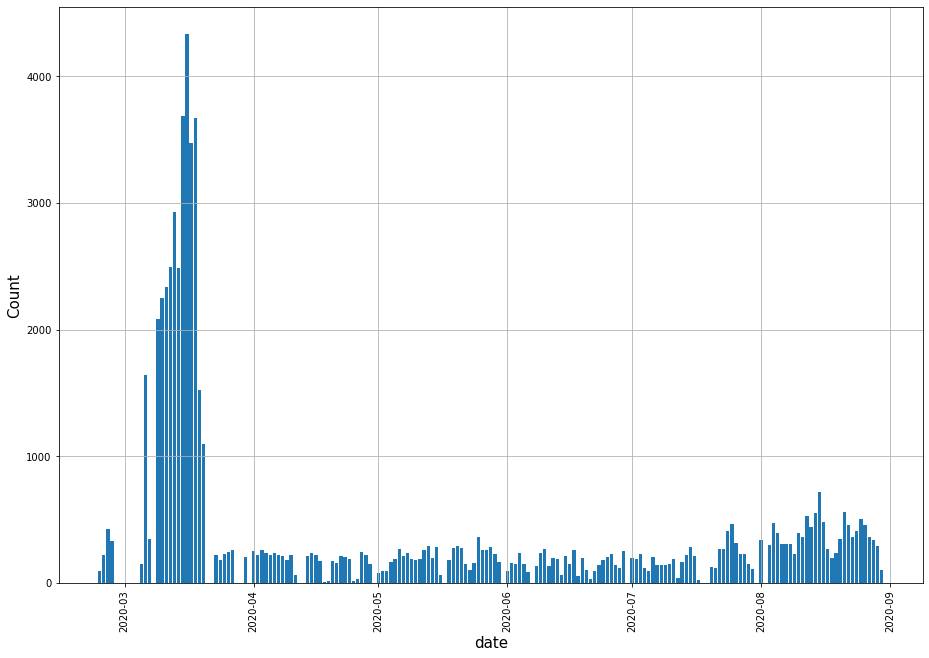

In [9]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_axes([0,0,1,1])
code = daywise_data['date']
count = daywise_data['Count']
ax.bar(code ,count)
plt.xlabel('date', fontsize=15)
plt.xticks(rotation=90)
plt.ylabel('Count', fontsize=15)
plt.grid(True) 
plt.show() 

In [10]:
march = APC_freq[(APC_freq['date']>='2020-03-01') & (APC_freq['date']<='2020-03-31')]

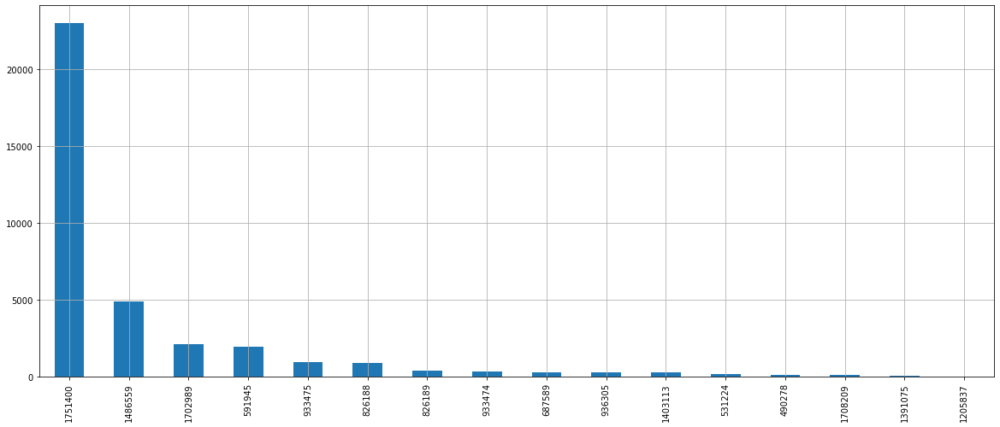

In [11]:
march['equipmentNumber'].value_counts().plot(figsize=(20,8),kind='bar').grid(True)

In [12]:
mss_fig_SMGA.shape

(68584, 363)

In [13]:
mss_fig_SMGA[['equipmentNumber','P_x_SerialNumber']].head()
a=mss_fig_SMGA.groupby(by=['equipmentNumber','P_x_SerialNumber'])["measuredAt"].count()
a= pd.DataFrame(a)
a.columns = ["Count"]
a.reset_index(['equipmentNumber','P_x_SerialNumber'])

,equipmentNumber,P_x_SerialNumber,Count
0,490278,S/N0192,726
1,531224,S/N0221,785
2,591945,S/N0269,3284
3,687589,S/N0370,418
4,687590,S/N0371,3677
5,826188,S/N0455,1565
6,826189,S/N0456,614
7,933474,S/N0526,965
8,933475,527,450
9,933475,S/N0527,962


### Equipment wise count

In [14]:
eqp_wise_count=mss_fig_SMGA.groupby(by=["equipmentNumber"])["measuredAt"].count()
eqp_wise_count= pd.DataFrame(eqp_wise_count)
eqp_wise_count.columns = ["Count"]

eqp_wise_count=eqp_wise_count.reset_index(["equipmentNumber"])

#arrange in order
eqp_wise_count = eqp_wise_count.sort_values('Count',ascending=False) 
eqp_wise_count.head()


,equipmentNumber,Count
18,1751400,29032
14,1486559,5935
10,1205837,4136
4,687590,3677
11,1389624,3339


In [15]:
# pd.set_option('display.max_columns',None) 
# pd.set_option('display.max_rows',None) 
eqp_wise_count

,equipmentNumber,Count
18,1751400,29032
14,1486559,5935
10,1205837,4136
4,687590,3677
11,1389624,3339
2,591945,3284
15,1702989,3238
17,1708209,2726
16,1708208,2537
19,1792283,1801


### knowledge data

In [16]:
knw_measu = pd.read_excel(r"D:\Device_anomaly_new\AVLAPC.xlsx",sheet_name = "measurement")
knw_measu.rename(columns={knw_measu.columns[0]:'Channel name'},inplace=True)
knw_measu.columns
knw_measu.head()

,Channel name,Descriptive name,Value,Min.,Max.,Default,Unit,State
0,Y_y_ParticlesPerCcm,Conc. PNC,0,0.0,50000.0,0,p/ccm,5
1,Y_y_DilutedParticlesPerCcm,Conc. PCRF Corr.,0,-inf,inf,0,p/ccm,5
2,Y_y_ParticlesIntegPerCcm,Integ. Conc. PNC,0,0.0,10000.0,0,p/ccm,5
3,Y_y_ParticlesIntegPerCcmExp,Integ. Conc. PNC (exp.),0,NaN,NaN,Value Undefined,p/ccm,5
4,Y_y_ParticlesIntegMeanPerCcm,Mean Conc. PNC,0,0.0,10000.0,0,p/ccm,5


In [17]:
knw_measu.shape

(205, 8)

### Equipment number : 1751400

In [18]:
mss_fig_1333446 = mss_fig_SMGA[mss_fig_SMGA.equipmentNumber == 1751400]
mss_fig_1333446['measuredAt'] = pd.to_datetime(mss_fig_1333446['measuredAt'])
mss_fig_1333446.shape

c:\users\u22v09\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(29032, 363)

In [19]:
# mss_fig_1333446['date'] = mss_fig_1333446['measuredAt'].dt.date
# eqwise_data = pd.DataFrame(mss_fig_1333446.groupby('date').date.count())
# eqwise_data.columns = ["Count"]
# eqwise_data=eqwise_data.reset_index(['date']) 

In [20]:
# fig = plt.figure(figsize=(12, 8))
# ax = fig.add_axes([0,0,1,1])
# code = eqwise_data['date']
# count = eqwise_data['Count']
# ax.bar(code ,count)
# plt.xlabel('date', fontsize=15)
# plt.xticks(rotation=90)
# plt.ylabel('Count', fontsize=15)
# plt.grid(True) 
# plt.show() 

In [21]:
dd = mss_fig_1333446.select_dtypes(exclude=['object'])

In [22]:
dd['date'] = dd['measuredAt'].dt.date
dd['date'] = pd.to_datetime(dd['date']).dt.date
#dd['date'] = pd.to_datetime(dd['date'],format='%Y%b%d')

c:\users\u22v09\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\users\u22v09\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [23]:
dd.head()

,equipmentNumber,measuredAt,P_x_.Hou_OperatingCPCPump,P_x_.Hou_OperatingLastService,P_x_.Hou_OperatingRD,P_x_.Hou_OperatingRDPump,P_x_.Hou_OperatingTotal,P_x_.t_TemperatureElectronicBoardSet,P_x_.t_TemperaturePND1Set,P_x_.t_TemperatureSampleLineSet,...,Y_r_RefResponseCheckResultFlag,Y_y_.U_Voltage1AnalogInterfaceBoard_13V,Y_y_.U_Voltage2AnalogInterfaceBoard_m13V,Y_y_.U_VoltageHetingLine_48V,Y_y_.U_VoltageMFCConditioning_24V,Y_y_APCGeneration,Y_y_OptSampleLineHeated_2m,Y_y_OptSampleLineHeated_5m,Unnamed: 0,date
3827,1751400,2020-04-01 00:07:06.365000+00:00,1474.0,1076.0,1106.0,30.0,3772.0,35.0,155.0,150.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-04-01
3828,1751400,2020-04-01 00:22:39.505000+00:00,1475.0,1076.0,1106.0,30.0,3772.0,35.0,155.0,150.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-04-01
3829,1751400,2020-04-01 00:38:12.956000+00:00,1475.0,1077.0,1107.0,30.0,3772.0,35.0,155.0,150.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-04-01
3830,1751400,2020-04-01 00:53:45.478000+00:00,1475.0,1077.0,1107.0,30.0,3773.0,35.0,155.0,150.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-04-01
3831,1751400,2020-04-01 01:09:18.963000+00:00,1475.0,1077.0,1107.0,30.0,3773.0,35.0,155.0,150.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-04-01


In [24]:
mss_fig_1333446 = dd

In [25]:
#mss_fig_1333446['date']=pd.to_datetime(mss_fig_1333446['date'])

In [26]:

l1 = list(mss_fig_1333446.columns)
l1
chnl_list = l1[2:(len(l1)-1)]
pd.DataFrame(chnl_list)

,0
0,P_x_.Hou_OperatingCPCPump
1,P_x_.Hou_OperatingLastService
2,P_x_.Hou_OperatingRD
3,P_x_.Hou_OperatingRDPump
4,P_x_.Hou_OperatingTotal
...,...
341,Y_y_.U_VoltageMFCConditioning_24V
342,Y_y_APCGeneration
343,Y_y_OptSampleLineHeated_2m
344,Y_y_OptSampleLineHeated_5m


In [27]:
out_of_range_df_1333446 = pd.melt(mss_fig_1333446, id_vars =['equipmentNumber'], value_vars = chnl_list) 
out_of_range_df_1333446.rename(columns={'variable':'Channel name'},inplace=True)
out_of_range_df_1333446 = out_of_range_df_1333446.merge(knw_measu, on = 'Channel name',how= 'inner')

#out_of_range_df_1486629['flag'] = None

In [28]:
out_of_range_df_1333446['Channel name'].nunique()

202

In [29]:
out_of_range_df_1333446['value'] = pd.to_numeric(out_of_range_df_1333446['value'], downcast="float")

In [30]:
out_of_range_df_1333446 = out_of_range_df_1333446.dropna(subset=[out_of_range_df_1333446.columns[5], out_of_range_df_1333446.columns[6],'value']) 

In [31]:
out_of_range_df_1333446['Min.'] = pd.to_numeric(out_of_range_df_1333446['Min.'], downcast="float")
out_of_range_df_1333446['Max.'] = pd.to_numeric(out_of_range_df_1333446['Max.'], downcast="float")
out_of_range_df_1333446 = out_of_range_df_1333446.dropna(subset=['value']) 
out_of_range_df_1333446['value'] = pd.to_numeric(out_of_range_df_1333446['value'], downcast="float")

In [32]:

out_of_range_df_1333446['value'].dtype

dtype('float32')

In [33]:
out_of_range_df_1333446.dropna(subset=[out_of_range_df_1333446.columns[5], out_of_range_df_1333446.columns[6],'value']) 
out_of_range_df_1333446['flag'] = None
out_of_range_df_1333446['flag'] = np.where((out_of_range_df_1333446['value'] < out_of_range_df_1333446[out_of_range_df_1333446.columns[5]]) | (out_of_range_df_1333446['value'] > out_of_range_df_1333446[out_of_range_df_1333446.columns[6]]),1,0)
out_of_range_df_1333446 = out_of_range_df_1333446.dropna(subset=[out_of_range_df_1333446.columns[5], out_of_range_df_1333446.columns[6],'value']) 
out_of_range_df_1333446.head()

,equipmentNumber,Channel name,value,Descriptive name,Value,Min.,Max.,Default,Unit,State,flag
0,1751400,P_x_.t_TemperatureElectronicBoardSet,35.0,Demand Temp. Electronic Board,35,10.0,60.0,45,°C,5,0
1,1751400,P_x_.t_TemperatureElectronicBoardSet,35.0,Demand Temp. Electronic Board,35,10.0,60.0,45,°C,5,0
2,1751400,P_x_.t_TemperatureElectronicBoardSet,35.0,Demand Temp. Electronic Board,35,10.0,60.0,45,°C,5,0
3,1751400,P_x_.t_TemperatureElectronicBoardSet,35.0,Demand Temp. Electronic Board,35,10.0,60.0,45,°C,5,0
4,1751400,P_x_.t_TemperatureElectronicBoardSet,35.0,Demand Temp. Electronic Board,35,10.0,60.0,45,°C,5,0


In [34]:
l=out_of_range_df_1333446.groupby(by=["Channel name","flag"])["value"].count()
l= pd.DataFrame(l)

l=l.reset_index(["Channel name","flag"])
l.shape
l2 = l.pivot_table('value',['Channel name'],'flag')

pd.set_option('display.max_columns',None) 
pd.set_option('display.max_rows',None) 
l2

flag,0,1
Channel name,,
P_x_.t_TemperatureElectronicBoardSet,29032.0,NaN
P_x_.t_TemperaturePND1Set,29032.0,NaN
P_x_.t_TemperatureSampleLineSet,29031.0,NaN
P_x_.t_TemperatureTECSet,29031.0,NaN
P_x_.t_TemperatureVPRSet,29032.0,NaN
P_x_ActualPCRF1_MFR,29027.0,NaN
P_x_ActualPCRF2_MFR,29027.0,NaN
P_x_ActualPCRF3_MFR,29027.0,NaN
P_x_ActualPCRF4_MFR,29027.0,NaN


In [35]:
l2.shape

(186, 2)

### Channels are going out of range

In [36]:
l3 = l2.dropna(subset=[l2.columns[1]])
l3

flag,0,1
Channel name,,
P_x_DRStep1,NaN,29031.0
P_x_DRStep2,NaN,29031.0
P_x_DRStep3,NaN,29031.0
Y_y_CPCButanolLevel,NaN,29032.0
Y_y_CPCConcentration,28359.0,671.0
Y_y_CPCPressureNozzle,NaN,29032.0
Y_y_RDDiskFrequency,29030.0,2.0
Y_y_RefCPCAmbientPressure,NaN,29032.0
Y_y_RefCPCButanolLevel,NaN,29031.0


In [37]:
l3["Channel_outOfRange"] = l3.index

c:\users\u22v09\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [38]:
chn_outRange = list(l3["Channel_outOfRange"])

In [39]:
chn_outRange

['P_x_DRStep1',
 'P_x_DRStep2',
 'P_x_DRStep3',
 'Y_y_CPCButanolLevel',
 'Y_y_CPCConcentration',
 'Y_y_CPCPressureNozzle',
 'Y_y_RDDiskFrequency',
 'Y_y_RefCPCAmbientPressure',
 'Y_y_RefCPCButanolLevel',
 'Y_y_RefCPCNozzlePressure',
 'Y_y_RefCPCPressureFlowOrifice',
 'Y_y_RefCPCTempCondenser',
 'Y_y_RefCPCTempOptic',
 'Y_y_RefCPCTempSaturator']

In [1]:
mss_fig_1333446.boxplot(column=['Y_y_CPCPulseHeight'], by=['date'], figsize = (20,10),rot=90)
plt.axhline(0.7, c='r') 
plt.axhline(1100, c='r') 

NameError: name 'mss_fig_1333446' is not defined

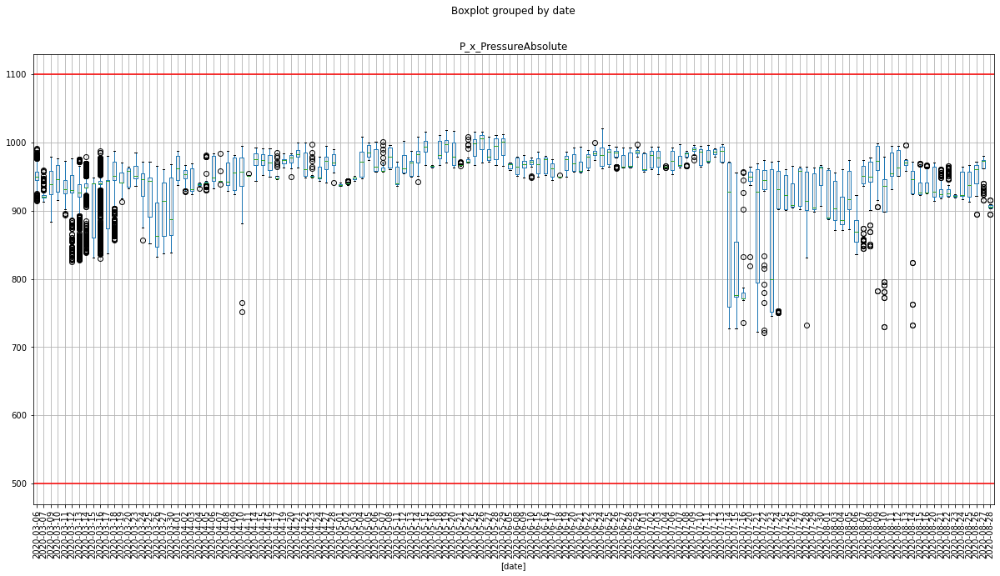

In [41]:
mss_fig_1333446.boxplot(column=['P_x_PressureAbsolute'], by=['date'], figsize = (20,10),rot=90)
plt.axhline(500, c='r') 
plt.axhline(1100, c='r') 

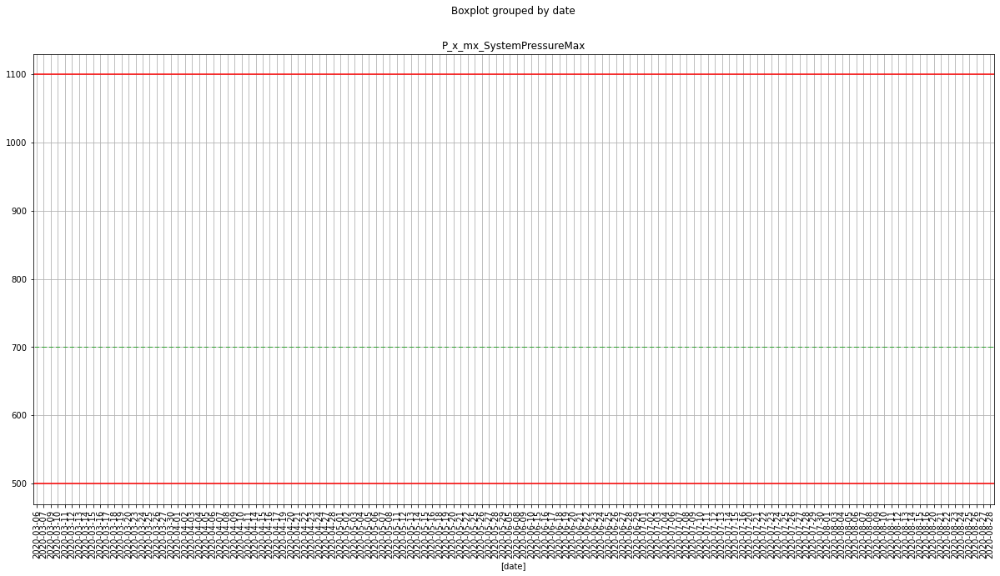

In [42]:
mss_fig_1333446.boxplot(column=['P_x_mx_SystemPressureMax'], by=['date'], figsize = (20,10),rot=90)
plt.axhline(500, c='r') 
plt.axhline(1100, c='r') 

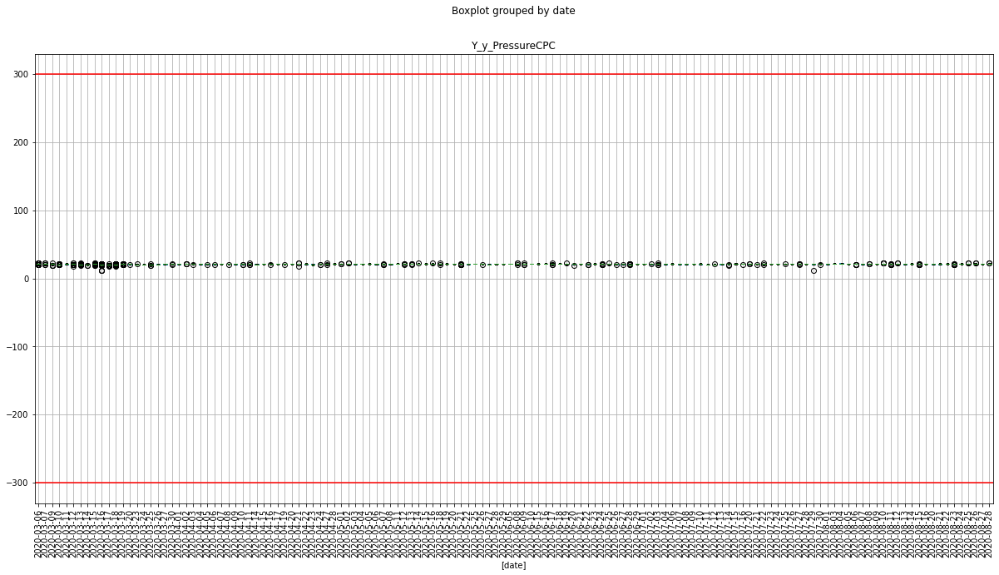

In [43]:
mss_fig_1333446.boxplot(column=['Y_y_PressureCPC'], by=['date'], figsize = (20,10),rot=90)
plt.axhline(-300, c='r') 
plt.axhline(300, c='r') 

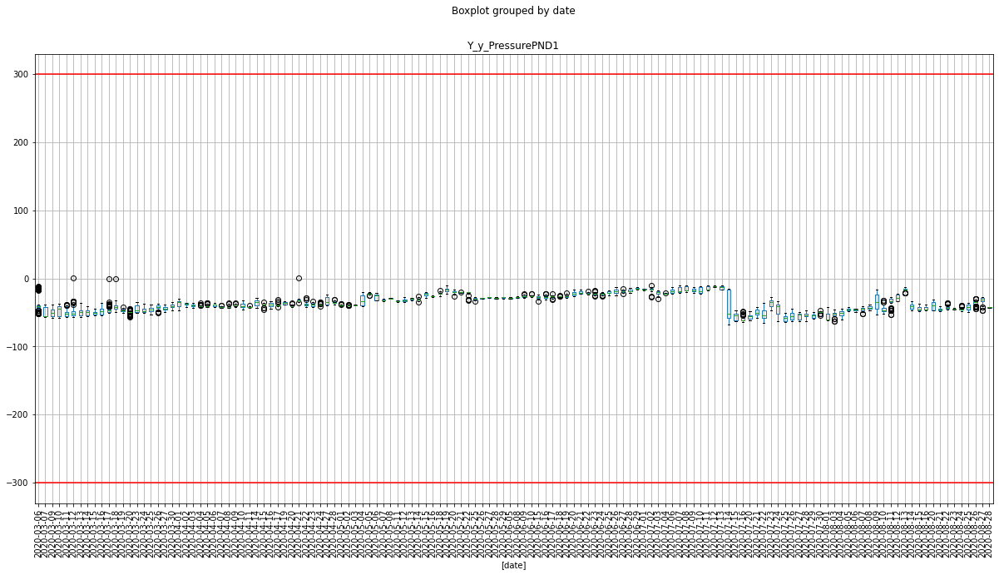

In [44]:
mss_fig_1333446.boxplot(column=['Y_y_PressurePND1'], by=['date'], figsize = (20,10),rot=90)
plt.axhline(-300, c='r') 
plt.axhline(300, c='r') 

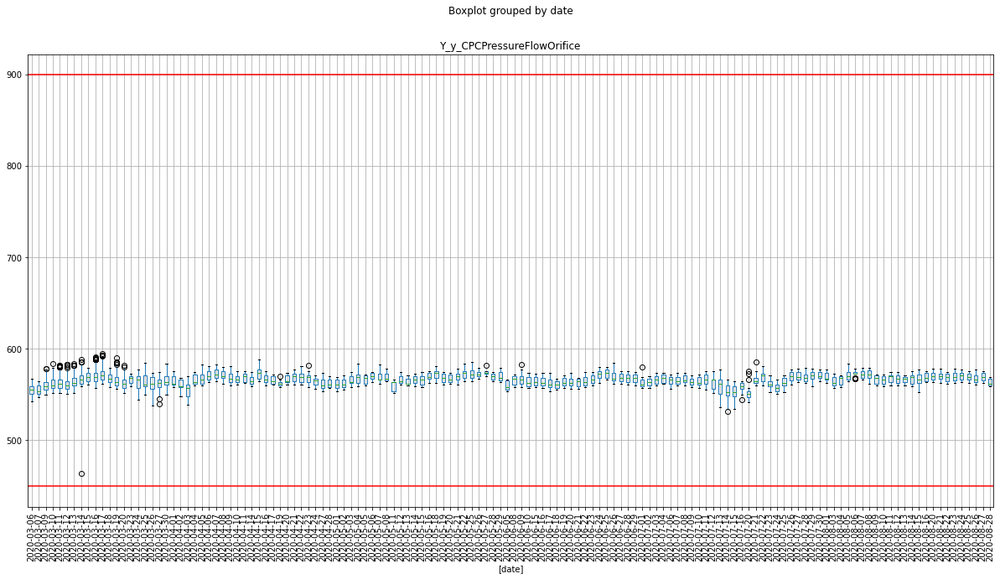

In [45]:
mss_fig_1333446.boxplot(column=['Y_y_CPCPressureFlowOrifice'], by=['date'], figsize = (20,10),rot=90)
plt.axhline(450, c='r') 
plt.axhline(900, c='r') 

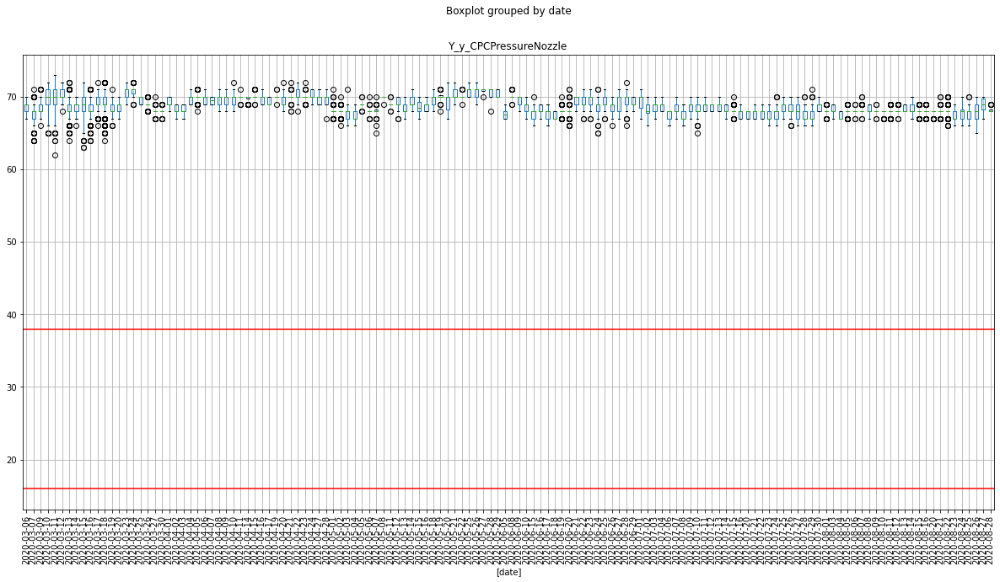

In [46]:
mss_fig_1333446.boxplot(column=['Y_y_CPCPressureNozzle'], by=['date'], figsize = (20,10),rot=90)
plt.axhline(16, c='r') 
plt.axhline(38, c='r') ############# we don't know its limit

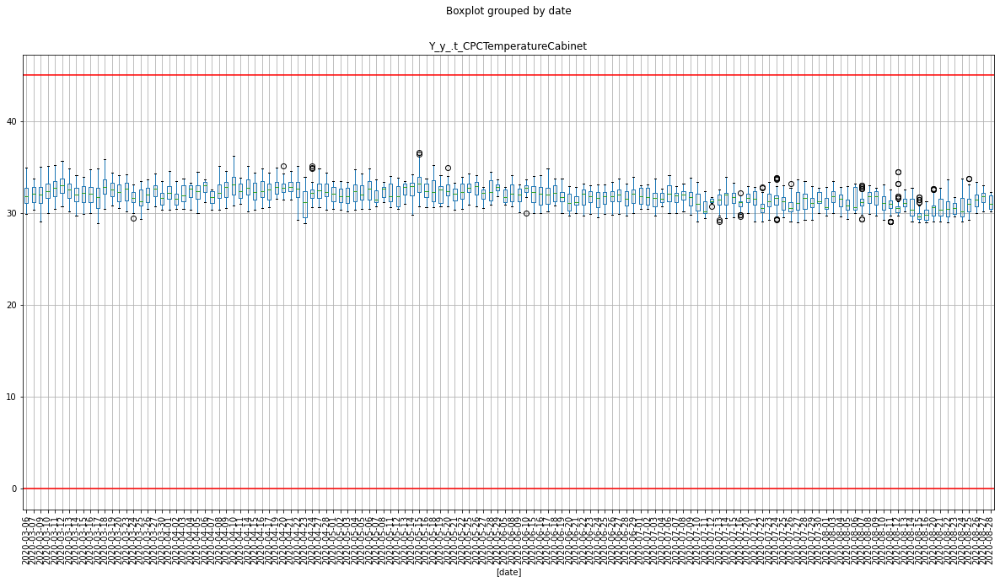

In [47]:
mss_fig_1333446.boxplot(column=['Y_y_.t_CPCTemperatureCabinet'], by=['date'], figsize = (20,10),rot=90)
plt.axhline(0, c='r') 
plt.axhline(45, c='r')

In [48]:
### daywise count channel going out of range

In [49]:
out_of_range_df_daywise = pd.melt(mss_fig_1333446, id_vars =['date'], value_vars = chnl_list) 
out_of_range_df_daywise.rename(columns={'variable':'Channel name'},inplace=True)
out_of_range_df_daywise = out_of_range_df_daywise.merge(knw_measu, on = 'Channel name')
out_of_range_df_daywise['flag'] = None
out_of_range_df_daywise['flag'] = np.where((out_of_range_df_daywise['value'] < out_of_range_df_daywise[out_of_range_df_daywise.columns[5]]) | (out_of_range_df_daywise['value'] > out_of_range_df_daywise[out_of_range_df_daywise.columns[6]]),1,0)
out_of_range_df_daywise = out_of_range_df_daywise.dropna(subset=[out_of_range_df_daywise.columns[5], out_of_range_df_daywise.columns[6],'value']) 
out_of_range_df_daywise.head()

,date,Channel name,value,Descriptive name,Value,Min.,Max.,Default,Unit,State,flag
0,2020-04-01,P_x_.t_TemperatureElectronicBoardSet,35.0,Demand Temp. Electronic Board,35,10.0,60.0,45,°C,5,0
1,2020-04-01,P_x_.t_TemperatureElectronicBoardSet,35.0,Demand Temp. Electronic Board,35,10.0,60.0,45,°C,5,0
2,2020-04-01,P_x_.t_TemperatureElectronicBoardSet,35.0,Demand Temp. Electronic Board,35,10.0,60.0,45,°C,5,0
3,2020-04-01,P_x_.t_TemperatureElectronicBoardSet,35.0,Demand Temp. Electronic Board,35,10.0,60.0,45,°C,5,0
4,2020-04-01,P_x_.t_TemperatureElectronicBoardSet,35.0,Demand Temp. Electronic Board,35,10.0,60.0,45,°C,5,0


In [50]:
out_of_range_df_daywise_P_x_ReserveCondUnit = out_of_range_df_daywise[out_of_range_df_daywise[out_of_range_df_daywise.columns[1]] == "Y_y_CPCConcentration"]                                                                      

In [51]:

out_of_range_df_daywise_P_x_ReserveCondUnit = out_of_range_df_daywise_P_x_ReserveCondUnit.reset_index(drop=True)
out_of_range_df_daywise_P_x_ReserveCondUnit.head()

,date,Channel name,value,Descriptive name,Value,Min.,Max.,Default,Unit,State,flag
0,2020-04-01,Y_y_CPCConcentration,111.66,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
1,2020-04-01,Y_y_CPCConcentration,303.43,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
2,2020-04-01,Y_y_CPCConcentration,534.32,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
3,2020-04-01,Y_y_CPCConcentration,7634.54,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
4,2020-04-01,Y_y_CPCConcentration,425.69,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0


In [52]:
#out_of_range_df_daywise_P_x_ReserveCondUnit_1 = out_of_range_df_daywise_P_x_ReserveCondUnit[out_of_range_df_daywise_P_x_ReserveCondUnit['flag'] ==0]
#out_of_range_df_daywise_P_x_ReserveCondUnit_1.tail()

out_of_range_df_daywise_P_x_ReserveCondUnit=out_of_range_df_daywise_P_x_ReserveCondUnit.dropna(subset=['value'])
out_of_range_df_daywise_P_x_ReserveCondUnit_1 = out_of_range_df_daywise_P_x_ReserveCondUnit[out_of_range_df_daywise_P_x_ReserveCondUnit['flag'] ==0]
out_of_range_df_daywise_P_x_ReserveCondUnit_1.head()

,date,Channel name,value,Descriptive name,Value,Min.,Max.,Default,Unit,State,flag
0,2020-04-01,Y_y_CPCConcentration,111.66,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
1,2020-04-01,Y_y_CPCConcentration,303.43,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
2,2020-04-01,Y_y_CPCConcentration,534.32,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
3,2020-04-01,Y_y_CPCConcentration,7634.54,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
4,2020-04-01,Y_y_CPCConcentration,425.69,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0


In [53]:
out_of_range_df_daywise_P_x_ReserveCondUnit

,date,Channel name,value,Descriptive name,Value,Min.,Max.,Default,Unit,State,flag
0,2020-04-01,Y_y_CPCConcentration,111.66,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
1,2020-04-01,Y_y_CPCConcentration,303.43,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
2,2020-04-01,Y_y_CPCConcentration,534.32,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
3,2020-04-01,Y_y_CPCConcentration,7634.54,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
4,2020-04-01,Y_y_CPCConcentration,425.69,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
5,2020-04-01,Y_y_CPCConcentration,457.16,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
6,2020-04-01,Y_y_CPCConcentration,25749.09,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,1
7,2020-04-01,Y_y_CPCConcentration,0.31,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
8,2020-04-01,Y_y_CPCConcentration,0.19,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0
9,2020-04-01,Y_y_CPCConcentration,0.12,Raw Concentration PNC,0,0.0,10000.0,0,p/ccm,5,0


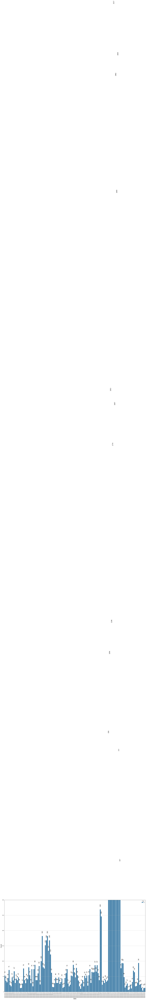

In [54]:
fig, ax1 = plt.subplots(figsize=(30,20))
plt.grid(True) 
graph = sns.countplot(ax = ax1,x="date",hue="flag", data=out_of_range_df_daywise_P_x_ReserveCondUnit[out_of_range_df_daywise_P_x_ReserveCondUnit['flag'] == 0])
graph.set_xticklabels(graph.get_xticklabels(),rotation=90,fontsize=11)
plt.ylabel('Count', fontsize=15)
plt.xlabel('Date', fontsize=15)
plt.ylim(0, 300)
#plt.xlim(datetime.date(2020, 3, 1), datetime.date(2020, 4, 31))
i=0
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 10,
        height,ha="center",rotation=90,fontsize=15)
    i += 1 

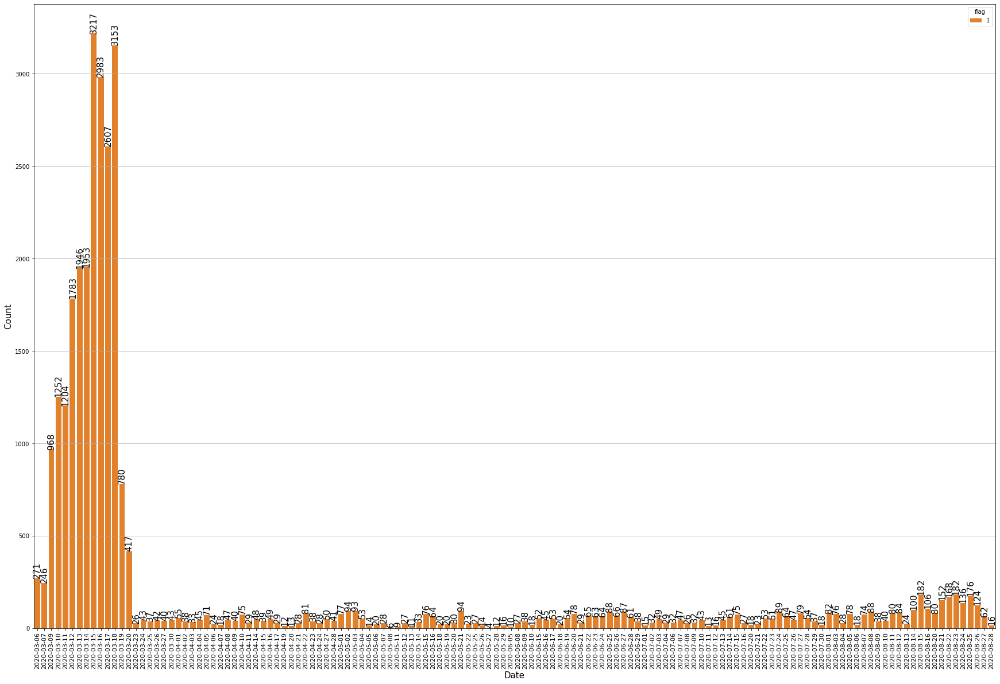

In [55]:
out_of_range_df_daywise_Y_r_M_PeakConcDiluted = out_of_range_df_daywise[out_of_range_df_daywise[out_of_range_df_daywise.columns[1]] == "Y_y_CPCPressureNozzle"] 
out_of_range_df_daywise_Y_r_M_PeakConcDiluted = out_of_range_df_daywise_Y_r_M_PeakConcDiluted.reset_index(drop=True)
out_of_range_df_daywise_Y_r_M_PeakConcDiluted.head()
out_of_range_df_daywise_Y_r_M_PeakConcDiluted=out_of_range_df_daywise_Y_r_M_PeakConcDiluted.dropna(subset=['value'])
out_of_range_df_daywise_Y_r_M_PeakConcDiluted = out_of_range_df_daywise_Y_r_M_PeakConcDiluted.sort_values('date',ascending=True) 
fig, ax1 = plt.subplots(figsize=(30,20))
plt.grid(True) 
graph = sns.countplot(ax = ax1,x="date",hue="flag", data=out_of_range_df_daywise_Y_r_M_PeakConcDiluted,palette=[ "C1"])
graph.set_xticklabels(graph.get_xticklabels(),rotation=90,fontsize=11)
plt.ylabel('Count', fontsize=15)
plt.xlabel('Date', fontsize=15)
i=0
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 10,
        height,ha="center",rotation=90,fontsize=15)
    i += 1 

### Daywise deviation

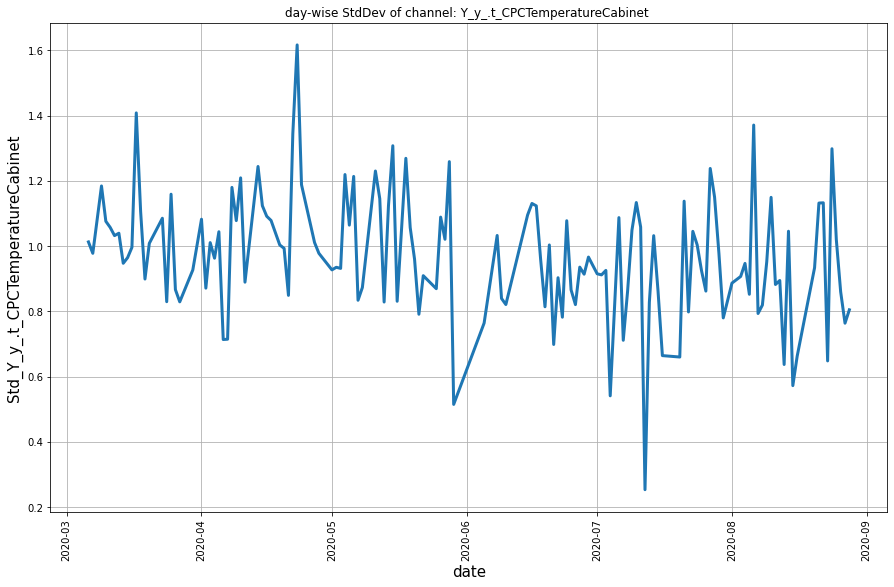

In [56]:
#datewise mean 
mss_fig_1333446 = mss_fig_1333446.sort_values('measuredAt',ascending=True) 


daywise_mean = mss_fig_1333446.groupby(by=['date'])['Y_y_.t_CPCTemperatureCabinet'].mean()
daywise_mean= pd.DataFrame(daywise_mean)
daywise_mean.columns = ["Mean_Y_y_.t_CPCTemperatureCabinet"]
daywise_mean=daywise_mean.reset_index(['date'])

#datewise SD

daywise_std = mss_fig_1333446.groupby(by=['date'])['Y_y_.t_CPCTemperatureCabinet'].std()
daywise_std= pd.DataFrame(daywise_std)
daywise_std.columns = ["Std_Y_y_.t_CPCTemperatureCabinet"]
daywise_std=daywise_std.reset_index(['date'])

plt.figure(figsize=(15,9))
plt.plot('date','Std_Y_y_.t_CPCTemperatureCabinet', data = daywise_std,linewidth=3)
#plt.legend(loc=1)
plt.xlabel('date',fontsize=15)
plt.ylabel('Std_Y_y_.t_CPCTemperatureCabinet',fontsize=15)
plt.title("day-wise StdDev of channel: Y_y_.t_CPCTemperatureCabinet ")
plt.xticks(rotation=90)
plt.grid()
plt.show() 


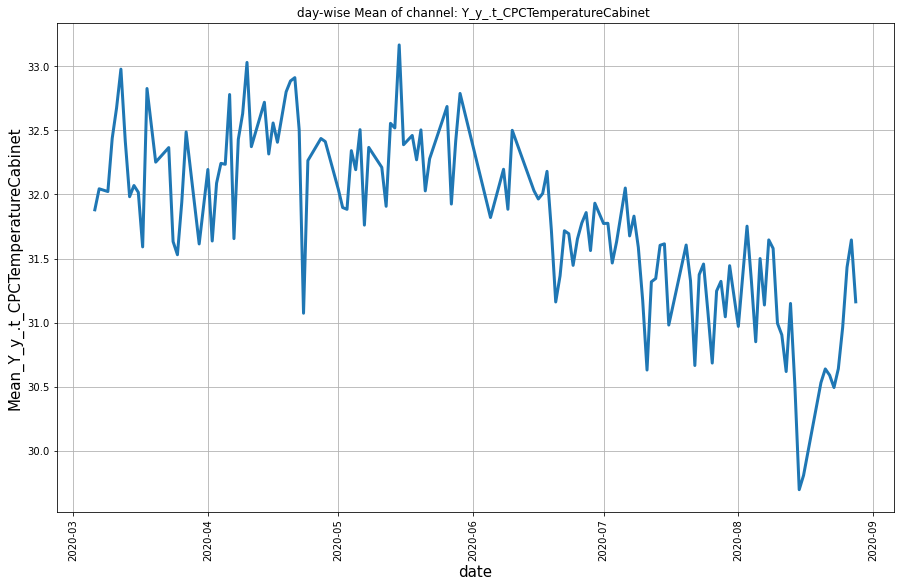

In [57]:
plt.figure(figsize=(15,9))
plt.plot('date','Mean_Y_y_.t_CPCTemperatureCabinet', data = daywise_mean,linewidth=3)
#plt.legend(loc=1)
plt.xlabel('date',fontsize=15)
plt.ylabel('Mean_Y_y_.t_CPCTemperatureCabinet',fontsize=15)
plt.title("day-wise Mean of channel: Y_y_.t_CPCTemperatureCabinet ")
plt.xticks(rotation=90)
plt.grid()
plt.show() 